In [14]:
# !pip install --upgrade pip
# !pip install --upgrade pandas
# !pip install omnipath
# !pip install tables   
# # necessary for pd.read_hdf()

# !pip install ipywidgets
# !pip install --upgrade jupyter
# !pip install IProgress

In [3]:
!pip install pandas==1.5.2
!pip install omnipath

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 105.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 299.5 MB/s eta 0:00:00


In [4]:
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context
import anndata as ad
import omnipath as op

# from .autonotebook import tqdm as notebook_tqdm


In [5]:
sc.set_figure_params(dpi=100, color_map='viridis_r')
sc.settings.verbosity = 1
sc.logging.print_header()

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.5.2 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.8


### read in metadata and train_cite_inputs.h5

In [6]:
lrz_path = '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93zoj/neurips_competition_data/'

In [7]:
metadata = pd.read_csv(lrz_path + 'metadata.csv')
metadata[metadata['cell_id'].isin(['45006fe3e4c8','d02759a80ba2','c016c6b0efa5','ba7f733a4f75','fbcf2443ffb2'])]

,cell_id,day,donor,cell_type,technology
28043,45006fe3e4c8,2,32606,HSC,citeseq
28044,d02759a80ba2,2,32606,HSC,citeseq
28045,c016c6b0efa5,2,32606,EryP,citeseq
28046,ba7f733a4f75,2,32606,NeuP,citeseq
28047,fbcf2443ffb2,2,32606,EryP,citeseq


In [8]:
df = pd.read_hdf(lrz_path + 'train_cite_inputs.h5')
df

gene_id,ENSG00000121410_A1BG,ENSG00000268895_A1BG-AS1,ENSG00000175899_A2M,ENSG00000245105_A2M-AS1,ENSG00000166535_A2ML1,ENSG00000128274_A4GALT,ENSG00000094914_AAAS,ENSG00000081760_AACS,ENSG00000109576_AADAT,ENSG00000103591_AAGAB,...,ENSG00000153975_ZUP1,ENSG00000086827_ZW10,ENSG00000174442_ZWILCH,ENSG00000122952_ZWINT,ENSG00000198205_ZXDA,ENSG00000198455_ZXDB,ENSG00000070476_ZXDC,ENSG00000162378_ZYG11B,ENSG00000159840_ZYX,ENSG00000074755_ZZEF1
cell_id,,,,,,,,,,,,,,,,,,,,,
45006fe3e4c8,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,4.090185,0.000000
d02759a80ba2,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,4.039545,0.0,0.0,0.000000,0.000000,0.000000,0.000000
c016c6b0efa5,0.0,0.0,0.0,0.0,0.0,3.847321,0.000000,3.847321,3.847321,0.000000,...,0.000000,0.000000,3.847321,4.529743,0.0,0.0,0.000000,3.847321,3.847321,0.000000
ba7f733a4f75,0.0,0.0,0.0,0.0,0.0,0.000000,3.436846,3.436846,0.000000,0.000000,...,3.436846,0.000000,4.113780,5.020215,0.0,0.0,0.000000,3.436846,4.113780,0.000000
fbcf2443ffb2,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,4.196826,0.000000,0.000000,...,0.000000,4.196826,4.196826,4.196826,0.0,0.0,3.518610,4.196826,3.518610,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
650ee456f0f3,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,4.397535,4.397535,5.084510,0.0,0.0,0.000000,0.000000,4.397535,4.397535
cc506e7707f5,0.0,0.0,0.0,0.0,0.0,0.000000,3.981467,4.665241,0.000000,0.000000,...,3.981467,0.000000,4.665241,3.981467,0.0,0.0,0.000000,0.000000,3.981467,0.000000
a91f1b55a520,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,4.497696,0.000000,4.497696,...,0.000000,0.000000,0.000000,4.497696,0.0,0.0,3.815622,4.497696,0.000000,0.000000


In [9]:
# filter dataset by IDs in list
metadata_filtered = metadata[metadata['cell_id'].isin(df.index.values)].set_index('cell_id')
metadata_filtered.head(3)

,day,donor,cell_type,technology
cell_id,,,,
45006fe3e4c8,2,32606,HSC,citeseq
d02759a80ba2,2,32606,HSC,citeseq
c016c6b0efa5,2,32606,EryP,citeseq


In [10]:
train_cite_inputs = ad.AnnData(df, obs=metadata_filtered)
train_cite_inputs

AnnData object with n_obs × n_vars = 70988 × 22050
    obs: 'day', 'donor', 'cell_type', 'technology'

In [11]:
import h5py
with h5py.File(lrz_path + r'train_cite_inputs.h5', 'r') as f:
    keys = []
    f.visit(keys.append)
    print(keys)      # keys to use for reading in datasets... still not working

['train_cite_inputs', 'train_cite_inputs/axis0', 'train_cite_inputs/axis1', 'train_cite_inputs/block0_items', 'train_cite_inputs/block0_values']


In [12]:
split_var_names = [n.split('_')[1] for n in train_cite_inputs.var_names]
train_cite_inputs.var_names = split_var_names
train_cite_inputs.var_names_make_unique() 

In [13]:
gene_ids = train_cite_inputs.var.index.tolist()
cell_ids = train_cite_inputs.obs.index.tolist()
gene_ids[:10]

['A1BG',
 'A1BG-AS1',
 'A2M',
 'A2M-AS1',
 'A2ML1',
 'A4GALT',
 'AAAS',
 'AACS',
 'AADAT',
 'AAGAB']

### omnipath

https://workflows.omnipathdb.org/tissue-hpa.pdf 

https://workflows.omnipathdb.org/networks-py.pdf

In [14]:
interactions = op.interactions.AllInteractions.get(directed = False, organism = 'human')
interactions  # "source and target are genes" -> can't find any matches?

,source,target,is_directed,is_stimulation,is_inhibition,consensus_direction,consensus_stimulation,consensus_inhibition,curation_effort,references,sources,type,references_stripped,n_references,n_sources,n_primary_sources
0,P0DP25,P48995,True,False,True,True,False,True,3,TRIP:11290752;TRIP:11983166;TRIP:12601176,TRIP,post_translational,11290752;11983166;12601176,3,1,1
1,P0DP24,P48995,True,False,True,True,False,True,3,TRIP:11290752;TRIP:11983166;TRIP:12601176,TRIP,post_translational,11290752;11983166;12601176,3,1,1
2,P0DP23,P48995,True,False,True,True,False,True,3,TRIP:11290752;TRIP:11983166;TRIP:12601176,TRIP,post_translational,11290752;11983166;12601176,3,1,1
3,Q03135,P48995,True,True,False,True,True,False,13,DIP:19897728;HPRD:12732636;IntAct:19897728;Lit...,DIP;HPRD;IntAct;Lit-BM-17;TRIP,post_translational,10980191;12732636;14551243;16822931;18430726;1...,8,5,5
4,P14416,P48995,True,True,False,True,True,False,1,TRIP:18261457,TRIP,post_translational,18261457,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252346,92135,Q8TDS4,True,False,False,False,False,False,1,Cellinker:15929991,Cellinker;Guide2Pharma_Cellinker,small_molecule_protein,15929991,1,2,1
252347,5311358,O94759,True,False,False,False,False,False,1,Cellinker:22847436,Cellinker;Guide2Pharma_Cellinker,small_molecule_protein,22847436,1,2,1
252348,5280360,Q9Y5Y4,True,False,False,False,False,False,1,Cellinker:12466225,Cellinker;Guide2Pharma_Cellinker,small_molecule_protein,12466225,1,2,1
252349,5311358,P48544,True,False,False,False,False,False,2,Cellinker:8688080;Cellinker:9804555,Cellinker;Guide2Pharma_Cellinker,small_molecule_protein,8688080;9804555,2,2,1


In [17]:
for i in gene_ids:
    if i in interactions['source']:
        print('source: ', i)
        
    if i in interactions['target']:
        print('target: ', i)
# -> no common genes?

In [18]:
op.requests.Annotations.resources()
# CellPhoneDB, ComPPI, ...

# transcriptional
# HPA_small = op.requests.Annotations.get(
# proteins = gene_ids[:10],  #[:3],  #['A1BG'],            # ['TP53', 'LMNA'],
# resources = 'ComPPI'
# )

('Adhesome',
 'Almen2009',
 'Baccin2019',
 'CORUM_Funcat',
 'CORUM_GO',
 'CSPA',
 'CSPA_celltype',
 'CancerDrugsDB',
 'CancerGeneCensus',
 'CancerSEA',
 'CellCall',
 'CellCellInteractions',
 'CellChatDB',
 'CellChatDB_complex',
 'CellPhoneDB',
 'CellPhoneDB_complex',
 'CellTalkDB',
 'CellTypist',
 'Cellinker',
 'Cellinker_complex',
 'ComPPI',
 'CytoSig',
 'DGIdb',
 'DisGeNet',
 'EMBRACE',
 'Exocarta',
 'GO_Intercell',
 'GPCRdb',
 'Guide2Pharma',
 'HGNC',
 'HPA_secretome',
 'HPA_subcellular',
 'HPA_tissue',
 'HPMR',
 'HumanCellMap',
 'ICELLNET',
 'ICELLNET_complex',
 'IntOGen',
 'Integrins',
 'InterPro',
 'KEGG-PC',
 'Kirouac2010',
 'LOCATE',
 'LRdb',
 'Lambert2018',
 'MCAM',
 'MSigDB',
 'Matrisome',
 'MatrixDB',
 'Membranome',
 'NetPath',
 'OPM',
 'PROGENy',
 'PanglaoDB',
 'Phobius',
 'Phosphatome',
 'Ramilowski2015',
 'Ramilowski_location',
 'SIGNOR',
 'SignaLink_function',
 'SignaLink_pathway',
 'Surfaceome',
 'TCDB',
 'TFcensus',
 'TopDB',
 'UniProt_family',
 'UniProt_keyword',
 'Un

In [21]:
# 1 of 2:
comppi = op.requests.Annotations.get(
proteins = gene_ids[:20],
resources = 'ComPPI'
)
comppi

,uniprot,genesymbol,entity_type,source,label,value,record_id
0,A8K2U0,A2ML1,protein,ComPPI,location,secretory-pathway,4773
1,A8K2U0,A2ML1,protein,ComPPI,score,0.7,4773
2,A8K2U0,A2ML1,protein,ComPPI,location,extracellular,4774
3,A8K2U0,A2ML1,protein,ComPPI,score,0.982,4774
4,A8K2U0,A2ML1,protein,ComPPI,location,membrane,4775
...,...,...,...,...,...,...,...
113,Q4L235,AASDH,protein,ComPPI,score,0.7,48809
114,Q4L235,AASDH,protein,ComPPI,location,membrane,48810
115,Q4L235,AASDH,protein,ComPPI,score,0.7,48810
116,Q4L235,AASDH,protein,ComPPI,location,mitochondrion,48811


In [22]:
# 2 of 2:
op.interactions.Transcriptional.get(dorothea_levels = ["A","B","C"], organism = 'human')  # which parameters?

,source,target,is_directed,is_stimulation,is_inhibition,consensus_direction,consensus_stimulation,consensus_inhibition,curation_effort,references,sources,references_stripped,n_references,n_sources,n_primary_sources
0,P01106,O14746,True,True,False,True,True,False,77,CollecTRI:10022128;CollecTRI:10491298;CollecTR...,CollecTRI;DoRothEA;ExTRI_CollecTRI;HTRI_Collec...,10022128;10491298;10606235;10625678;10637317;1...,75,15,4
1,P84022,P05412,True,True,False,True,True,False,3,CollecTRI:10022869;CollecTRI:12374795;DoRothEA...,CollecTRI;DoRothEA;ExTRI_CollecTRI;NTNU.Curate...,10022869;12374795,2,10,2
2,Q13485,P05412,True,True,False,True,True,False,3,CollecTRI:10022869;CollecTRI:12374795;DoRothEA...,CollecTRI;DoRothEA;ExTRI_CollecTRI;NTNU.Curate...,10022869;12374795,2,10,2
3,P42229,P60568,True,True,False,True,True,False,12,CollecTRI:10022878;CollecTRI:11435608;CollecTR...,CollecTRI;ExTRI_CollecTRI;KEGG-MEDICUS,10022878;11435608;17182565;17911616;22854263;2...,12,3,2
4,P51692,P60568,True,True,False,True,True,False,1,CollecTRI:10022878,CollecTRI;ExTRI_CollecTRI;KEGG-MEDICUS,10022878,1,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87885,COMPLEX:O75376_Q92769_Q96ST3,P10144,True,False,True,True,False,True,0,NaN,KEGG-MEDICUS,None,None,1,1
87886,P15923,P42773,True,True,False,True,True,False,0,NaN,KEGG-MEDICUS,None,None,1,1
87887,COMPLEX:P19793_Q13133,P24385,True,True,False,True,True,False,0,NaN,KEGG-MEDICUS,None,None,1,1
87888,P28702,P16615,True,True,False,True,True,False,0,NaN,KEGG-MEDICUS,None,None,1,1


### preprocess

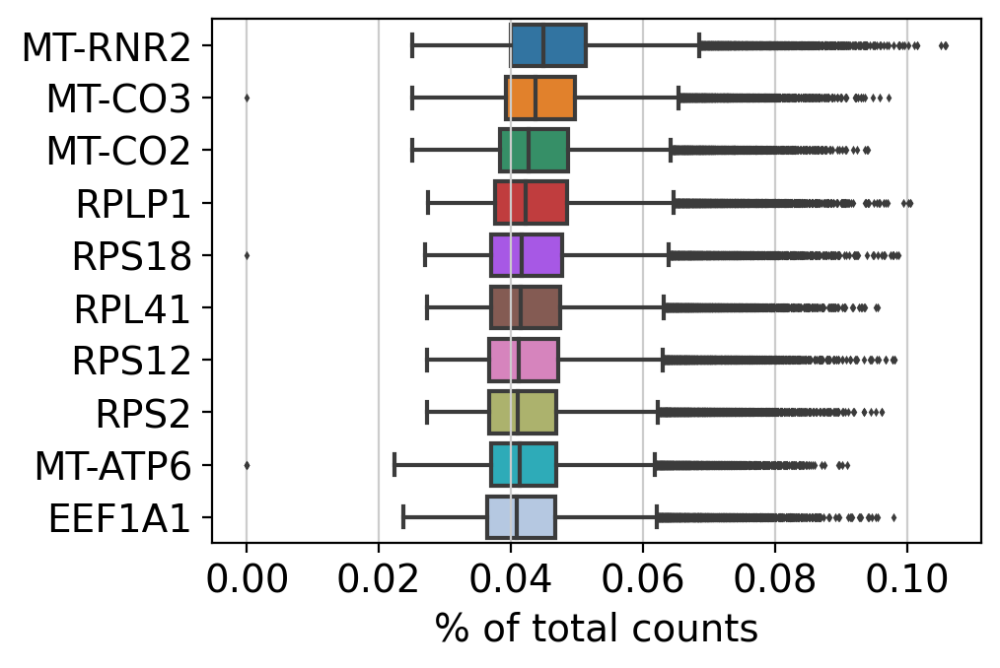

In [24]:
sc.pl.highest_expr_genes(train_cite_inputs, n_top=10)

In [25]:
sc.pp.filter_cells(train_cite_inputs, min_genes=200)
sc.pp.filter_genes(train_cite_inputs, min_cells=10)  # 3

In [26]:
train_cite_inputs

AnnData object with n_obs × n_vars = 70988 × 21601
    obs: 'day', 'donor', 'cell_type', 'technology', 'n_genes'
    var: 'n_cells'

In [27]:
# information about mitochondrial genes (-> quality control)
train_cite_inputs.var['mt'] = train_cite_inputs.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(train_cite_inputs, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

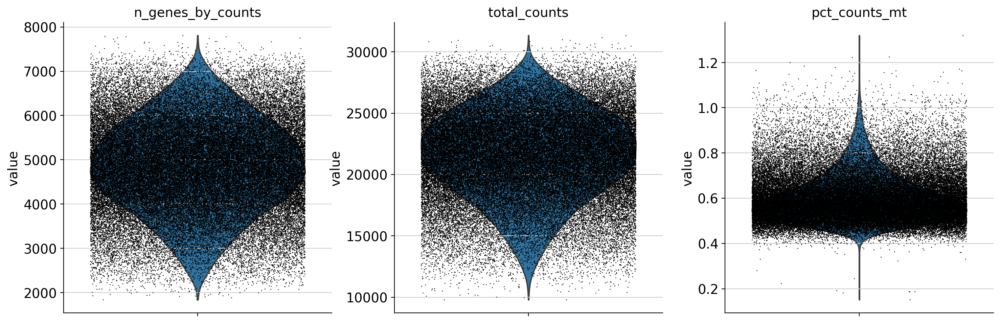

In [28]:
sc.pl.violin(train_cite_inputs, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

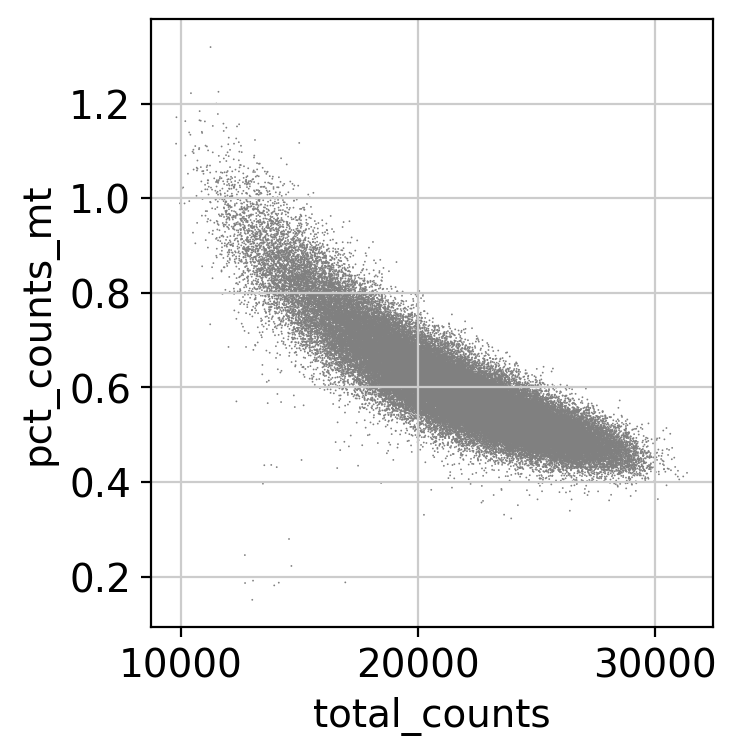

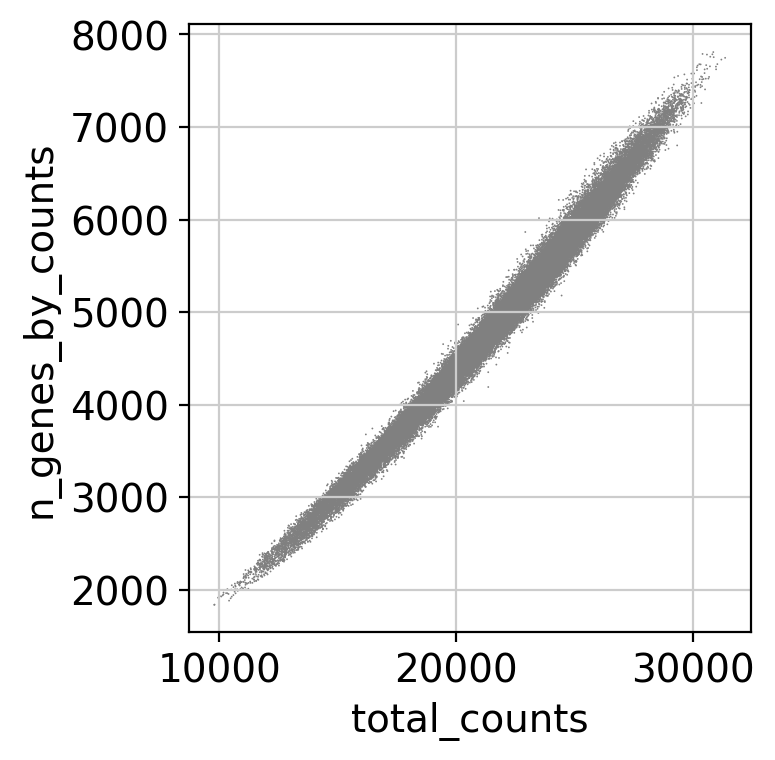

In [29]:
sc.pl.scatter(train_cite_inputs, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(train_cite_inputs, x='total_counts', y='n_genes_by_counts')

In [17]:
# filter cells that have too many mitochondrial genes expressed or too many total counts  # already cleaned data
# train_cite_inputs = train_cite_inputs[train_cite_inputs.obs.n_genes_by_counts < 7500, :]
# train_cite_inputs = train_cite_inputs[train_cite_inputs.obs.n_genes_by_counts > 2500, :]
# train_cite_inputs = train_cite_inputs[train_cite_inputs.obs.pct_counts_mt < 0.9, :]
# train_cite_inputs = train_cite_inputs[train_cite_inputs.obs.pct_counts_mt > 0.42, :]

In [30]:
# total-count normalize -> 10000 reads per cell
sc.pp.normalize_total(train_cite_inputs, target_sum=1e4)

In [19]:
# logarithmize data  # already done
# sc.pp.log1p(train_cite_inputs)

In [31]:
# identify highly variable genes
sc.pp.highly_variable_genes(train_cite_inputs, min_mean=0.0125, max_mean=3, min_disp=0.5)


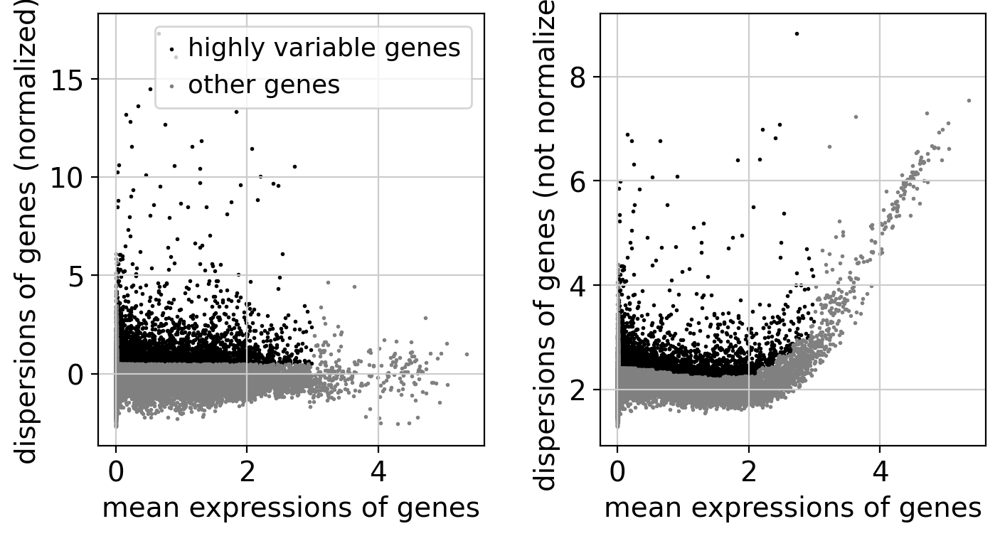

In [32]:
sc.pl.highly_variable_genes(train_cite_inputs)

In [33]:
# set .raw attribute -> normalized and logarithmized raw gene expression
train_cite_inputs.raw = train_cite_inputs


In [34]:
# filtering
train_cite_inputs = train_cite_inputs[:, train_cite_inputs.var.highly_variable]
# regress out effects of total counts per cell, scale gene to unit variance
sc.pp.regress_out(train_cite_inputs, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(train_cite_inputs, max_value=10)


### PCA
-> reduce dimensionality

In [35]:
sc.tl.pca(train_cite_inputs, svd_solver='arpack')

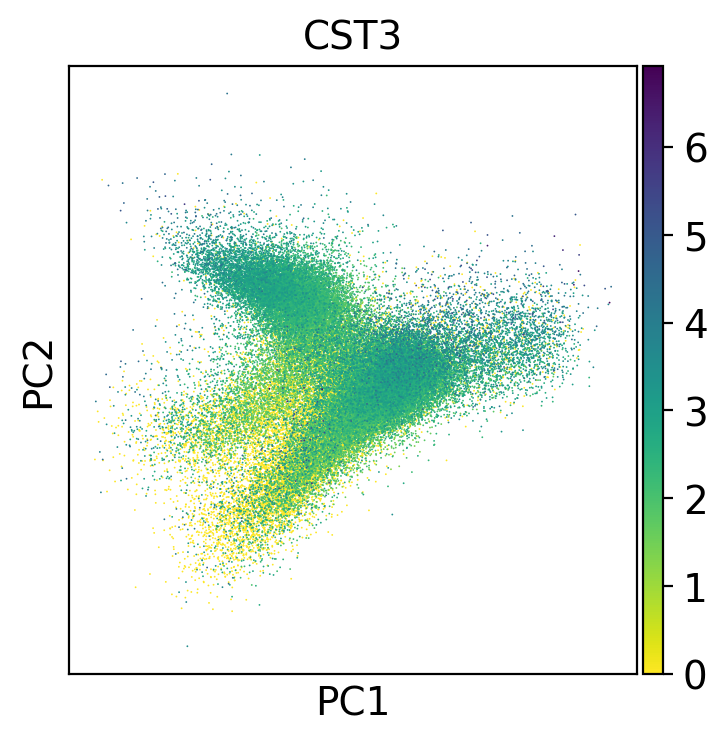

In [36]:
sc.pl.pca(train_cite_inputs, color='CST3')

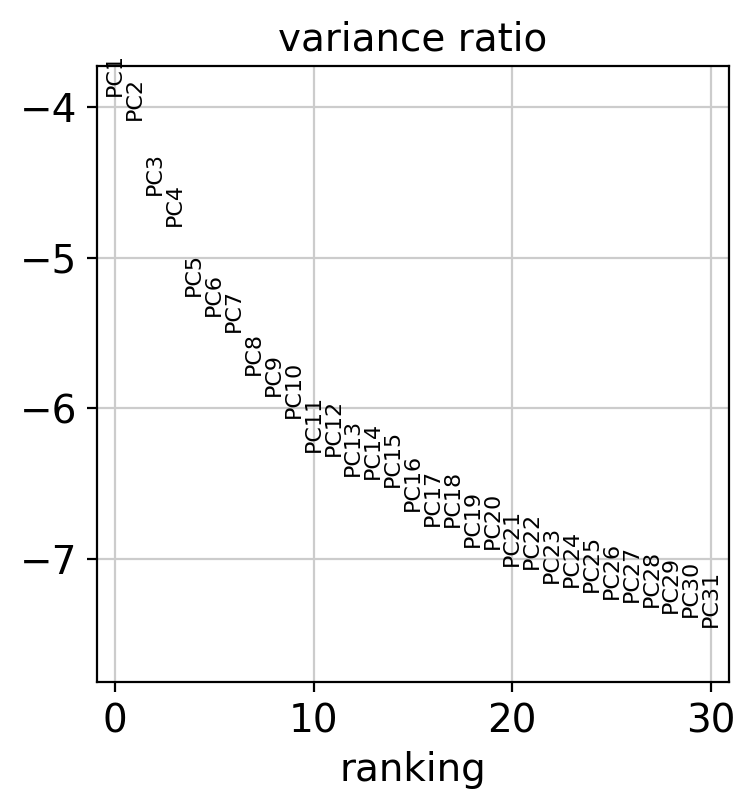

In [37]:
sc.pl.pca_variance_ratio(train_cite_inputs, log=True)

In [38]:
# train_cite_inputs.write('../../train_cite_inputs_preprocessed.h5')


In [39]:
train_cite_inputs

AnnData object with n_obs × n_vars = 70988 × 3963
    obs: 'day', 'donor', 'cell_type', 'technology', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [40]:
# neighbourhood graph of cells:
sc.pp.neighbors(train_cite_inputs, n_neighbors=10, n_pcs=40)

In [41]:
sc.tl.umap(train_cite_inputs)

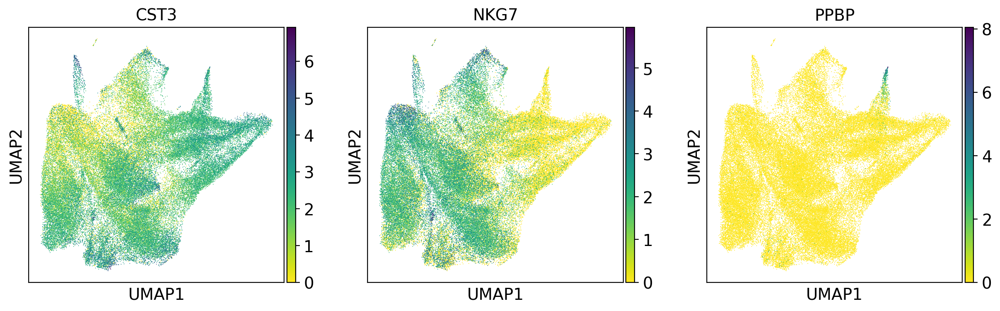

In [42]:
sc.pl.umap(train_cite_inputs, color=['CST3', 'NKG7', 'PPBP'])  # show raw gene expression

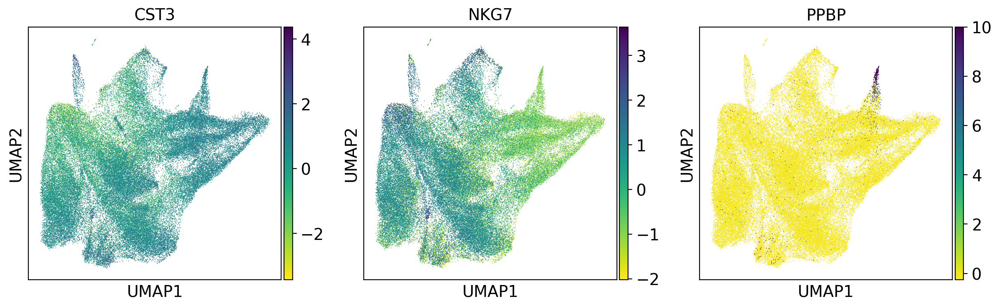

In [43]:
sc.pl.umap(train_cite_inputs, color=['CST3', 'NKG7', 'PPBP'], use_raw=False)  # plot scaled and corrected gene expression

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


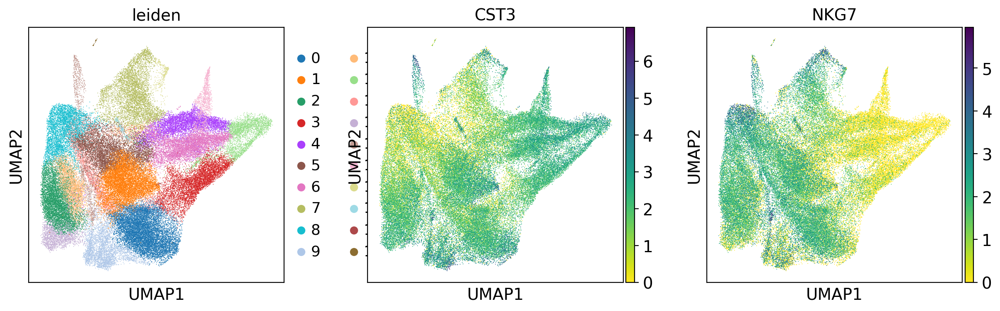

In [44]:
sc.tl.leiden(train_cite_inputs)
sc.pl.umap(train_cite_inputs, color=['leiden', 'CST3', 'NKG7'])

### visualize according to Scanpy tutorial

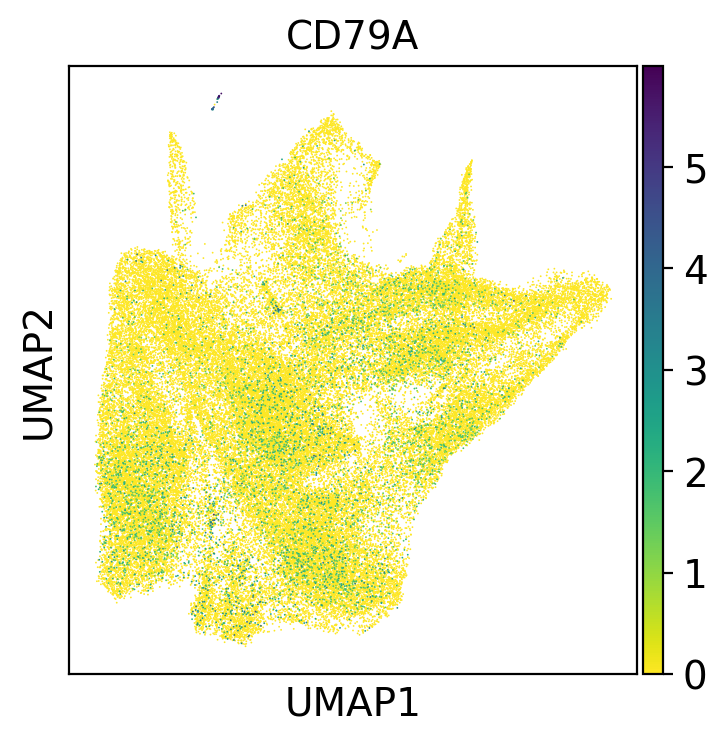

In [45]:
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(train_cite_inputs, color='CD79A')

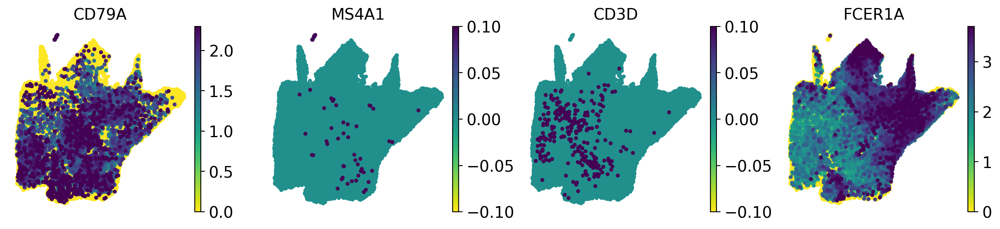

In [46]:
with rc_context({'figure.figsize': (3, 3)}):
    sc.pl.umap(train_cite_inputs, color=['CD79A', 'MS4A1', 'CD3D', 'FCER1A'], s=50, frameon=False, ncols=4, vmax='p99')

In [47]:
sc.tl.leiden(train_cite_inputs, key_added='clusters', resolution=0.5)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


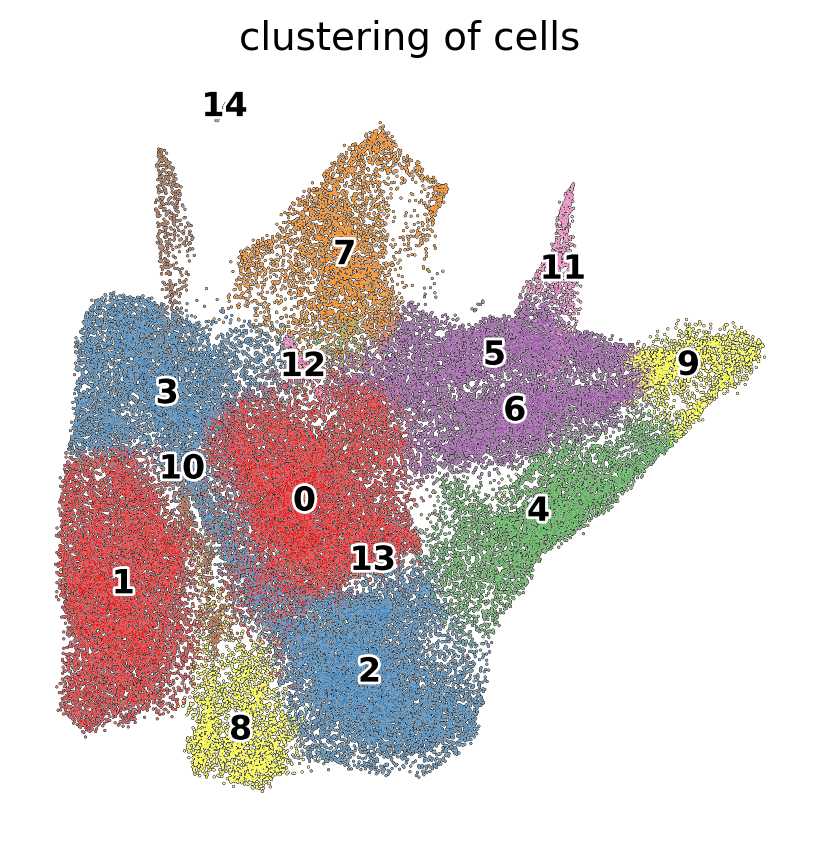

In [48]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(train_cite_inputs, color='clusters', add_outline=True, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False,
               title='clustering of cells', palette='Set1')